In [1]:
# Useful for debugging
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [2]:
basic_inputs = {    
    'n_particle': 1000000,
    'total_charge': {'value':1, 'units':'pC'},
    'random_type': 'hammersley',
    'start': {
        'MTE':{'units': 'meV', 'value': 150}, 
        'type': 'cathode'}    
}

laser_inputs={
        'type': 'rg',
        'truncation_fraction': {'units': 'dimensionless', 'value': 0.5},
        'truncation_radius': {'units': 'mm', 'value': 2}
}

In [3]:
from distgen import Generator

In [4]:
speckle_inputs = {
    'type': 'file2d',
    'file': 'data/objective_speckle.png',
    'min_x': {'units':'mm', 'value': -2},
    'max_x': {'units':'mm', 'value': +2},
    'min_y': {'units':'mm', 'value': -2},
    'max_y': {'units':'mm', 'value': +2},

}

In [5]:
speckle_only = basic_inputs.copy()

In [6]:
speckle_only['xy_dist'] = speckle_inputs

In [7]:
speckle_only

{'n_particle': 1000000,
 'total_charge': {'value': 1, 'units': 'pC'},
 'random_type': 'hammersley',
 'start': {'MTE': {'units': 'meV', 'value': 150}, 'type': 'cathode'},
 'xy_dist': {'type': 'file2d',
  'file': 'data/objective_speckle.png',
  'min_x': {'units': 'mm', 'value': -2},
  'max_x': {'units': 'mm', 'value': 2},
  'min_y': {'units': 'mm', 'value': -2},
  'max_y': {'units': 'mm', 'value': 2}}}

In [8]:
D = Generator(speckle_only)

In [9]:
P = D.run()

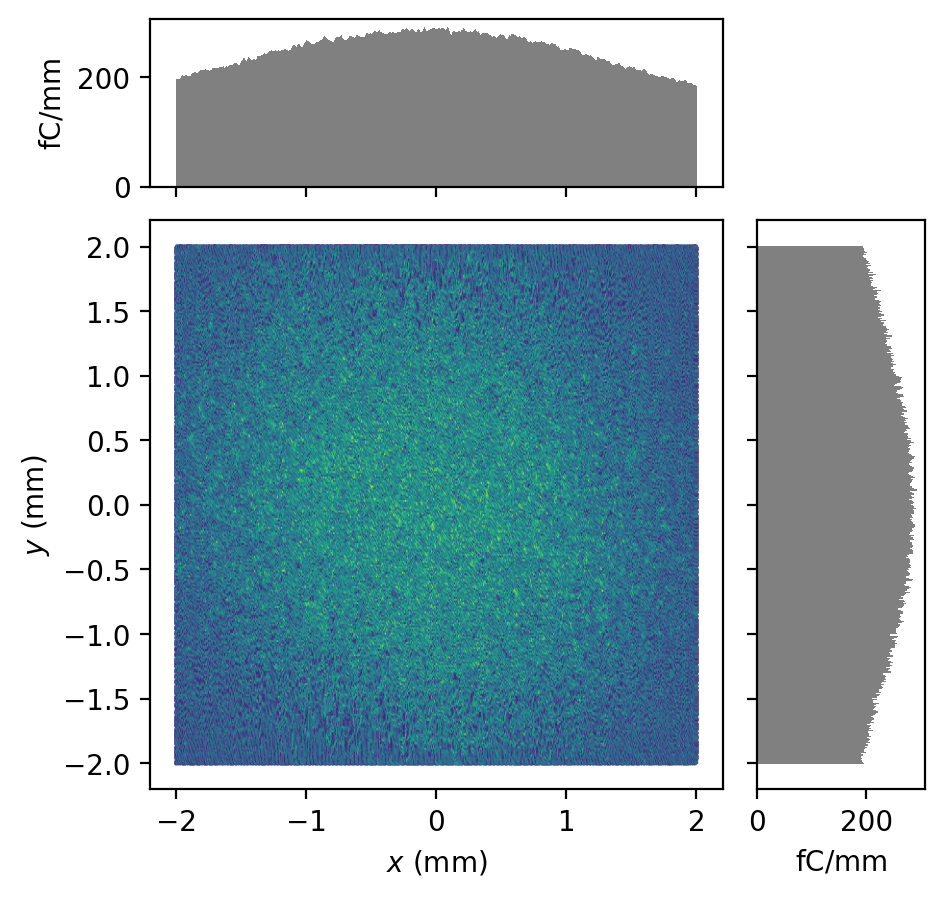

In [10]:
P.plot('x', 'y', figsize=(5,5))

In [11]:
laser_with_speckle = basic_inputs.copy()

In [12]:
product = {
    'type': 'product',
    'dists': {
        'laser': laser_inputs,
        'speckle': speckle_inputs
    }
}

laser_with_speckle['xy_dist']=product

laser_with_speckle

{'n_particle': 1000000,
 'total_charge': {'value': 1, 'units': 'pC'},
 'random_type': 'hammersley',
 'start': {'MTE': 150.0 <Unit('millielectron_volt')>, 'type': 'cathode'},
 'xy_dist': {'type': 'product',
  'dists': {'laser': {'type': 'rg',
    'truncation_fraction': {'units': 'dimensionless', 'value': 0.5},
    'truncation_radius': {'units': 'mm', 'value': 2}},
   'speckle': {'type': 'file2d',
    'file': '/Users/colwyngulliford/GitHub/distgen/docs/examples/data/objective_speckle.png',
    'min_x': -2.0 <Unit('millimeter')>,
    'max_x': 2.0 <Unit('millimeter')>,
    'min_y': -2.0 <Unit('millimeter')>,
    'max_y': 2.0 <Unit('millimeter')>}}}}

In [13]:
D = Generator(laser_with_speckle)

In [14]:
P = D.run()

rg
file2d


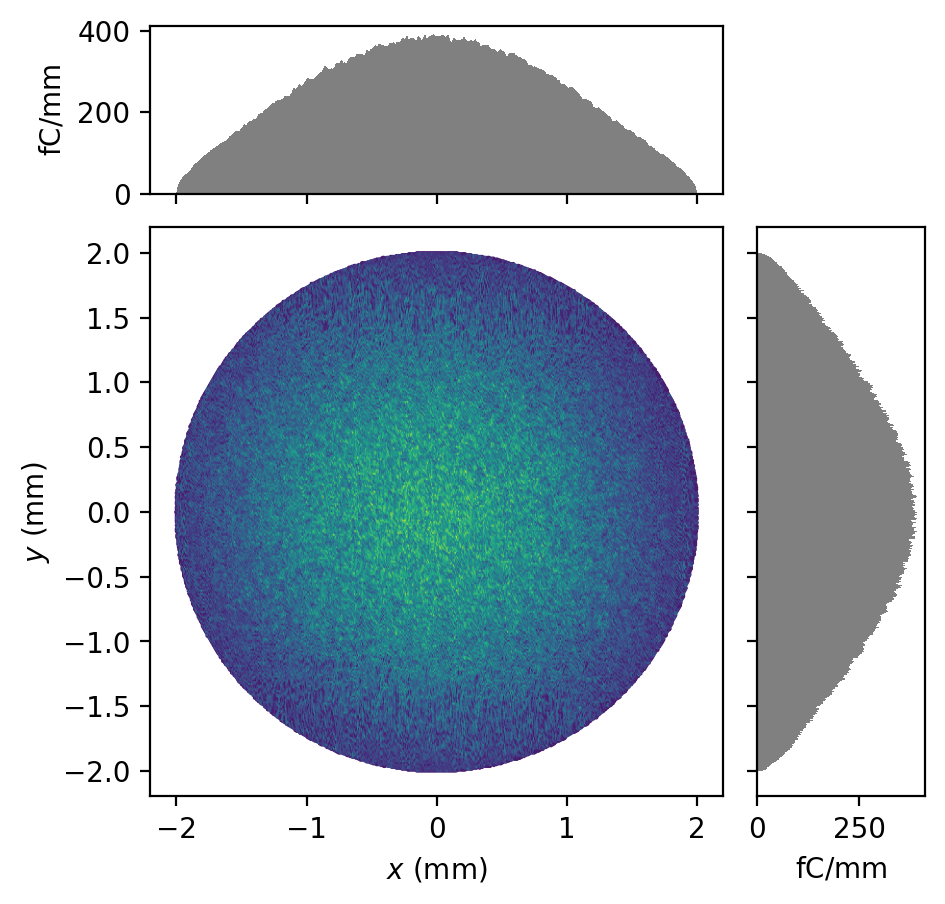

In [15]:
P.plot('x', 'y', figsize=(5,5))

In [16]:
import numpy as np
from scipy.fft import fft2, fftshift

def generate_speckle_pattern(size, scale=1.0):
    """
    Generates a 2D laser speckle pattern.

    Parameters:
    - size: tuple of ints, the shape of the output 2D array (height, width).
    - scale: float, scaling factor for the random phase values to adjust speckle size.

    Returns:
    - 2D NumPy array representing the laser speckle pattern.
    """
    # Generate random phase values
    phase_random = np.exp(1j * 2 * np.pi * np.random.rand(*size))

    # Apply Fourier transform to get the field distribution
    field_distribution = fftshift(fft2(phase_random))

    # Calculate intensity pattern (speckle pattern)
    speckle_pattern = np.abs(field_distribution)**2

    # Scale the speckle pattern for better visualization
    speckle_pattern_scaled = speckle_pattern / np.max(speckle_pattern) * scale

    return speckle_pattern_scaled

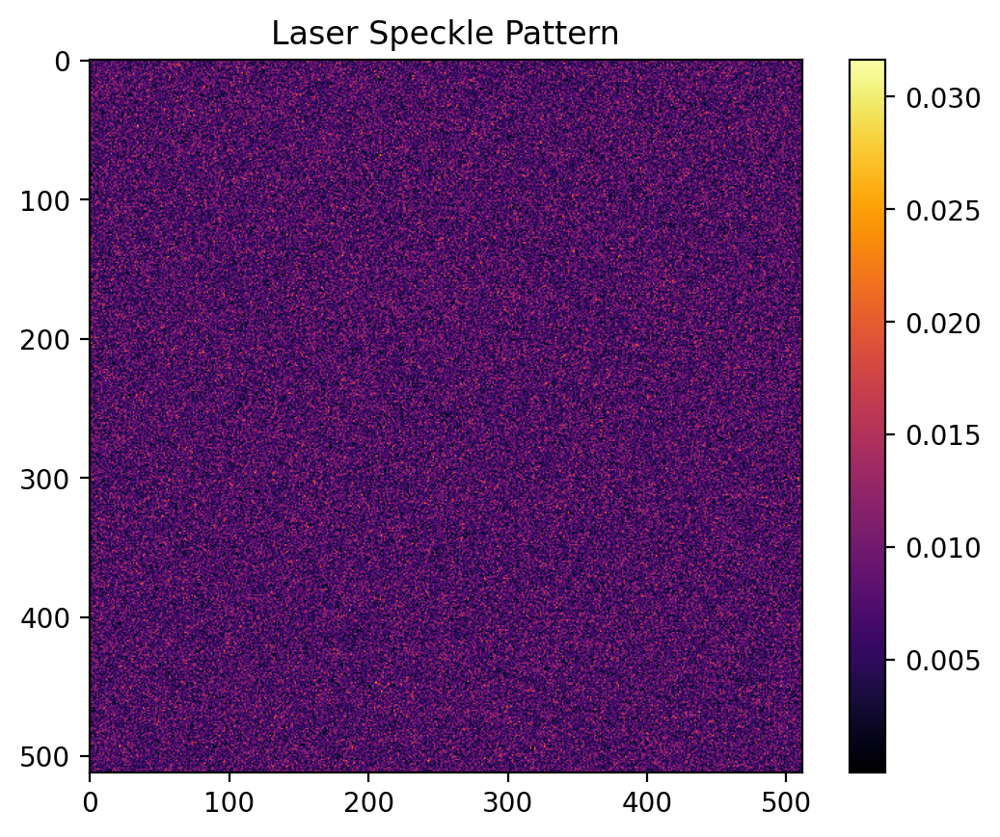

In [17]:

import matplotlib.pyplot as plt

# Generate a speckle pattern with desired size
speckle_pattern = generate_speckle_pattern((512, 512), scale=0.001)

# Plot the speckle pattern
plt.imshow(np.sqrt(speckle_pattern), cmap='inferno')
plt.colorbar()
plt.title('Laser Speckle Pattern')
plt.show()

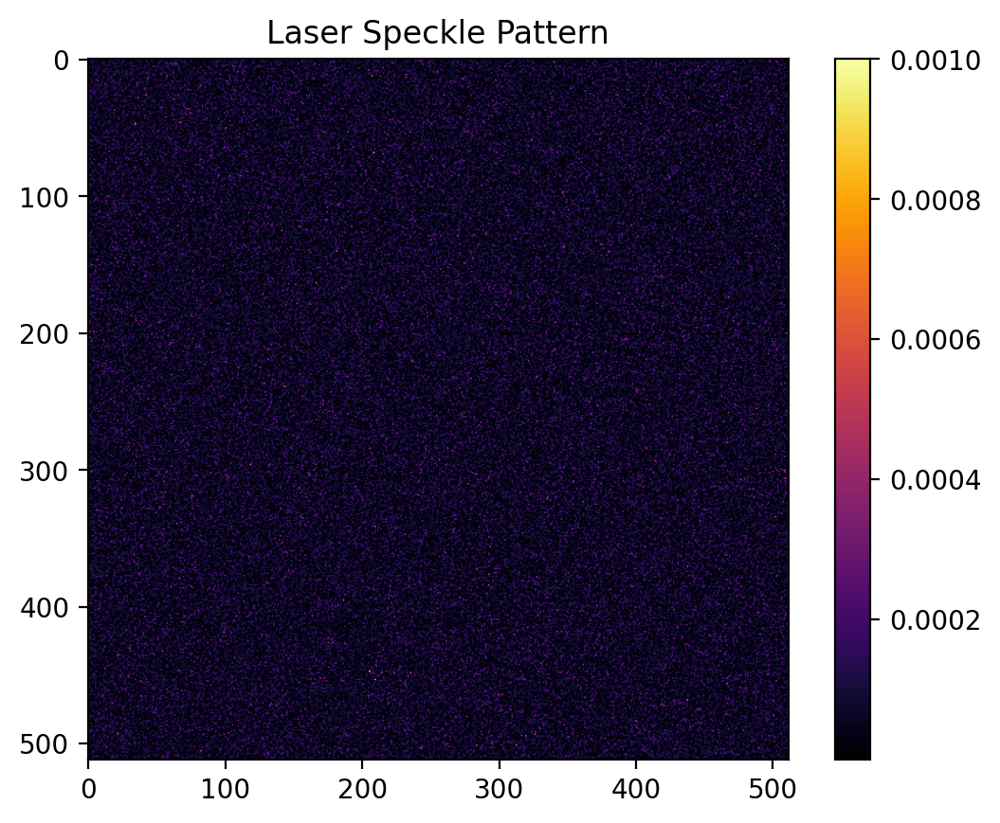

In [18]:
# Plot the speckle pattern
plt.imshow(speckle_pattern, cmap='inferno')
plt.colorbar()
plt.title('Laser Speckle Pattern')
plt.show()

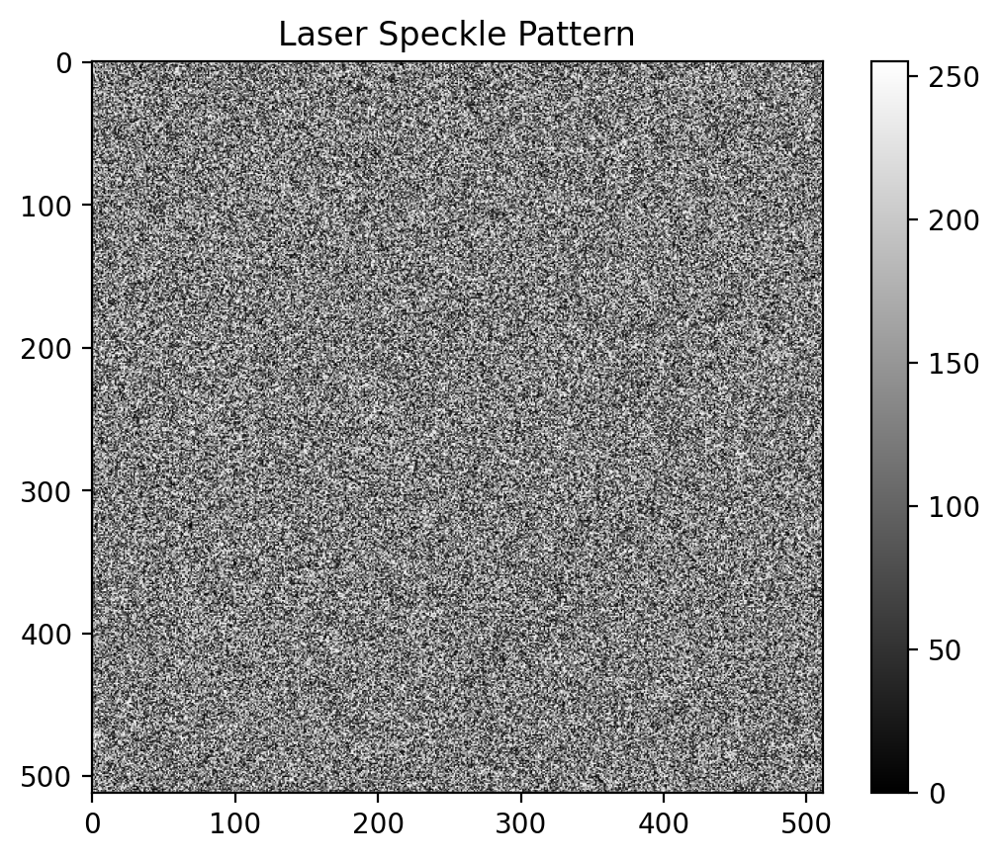

In [19]:
import numpy as np
from scipy.ndimage import gaussian_filter
from matplotlib import pyplot as plt

def generate_laser_speckle_scipy(image_size, speckle_size):
    """
    Generate a laser speckle pattern using NumPy and SciPy.

    Parameters:
    - image_size: Tuple of the form (height, width) for the output image size.
    - speckle_size: Desired speckle size in the pattern, adjusted by the sigma of the Gaussian filter.

    Returns:
    - speckle_pattern: Generated laser speckle pattern as a numpy array.
    """
    # Generate random noise
    noise = np.random.rand(image_size[0], image_size[1])

    # Apply Gaussian filter to create the speckle pattern
    # The sigma value controls the blurring effect, thus affecting the speckle size
    sigma = speckle_size / 3  # Approximate conversion to make sigma relate to speckle size
    speckle_pattern = gaussian_filter(noise, sigma=sigma)

    # Normalize the speckle pattern to a suitable range for visualization (0-255)
    speckle_pattern = np.interp(speckle_pattern, (speckle_pattern.min(), speckle_pattern.max()), (0, 255))

    return speckle_pattern

# Example usage
image_size = (512, 512)  # Image size as (height, width)
speckle_size = 0.1  # Desired speckle size

speckle_pattern = generate_laser_speckle_scipy(image_size, speckle_size)

# Display the generated speckle pattern
plt.imshow(speckle_pattern, cmap='gray')
plt.title('Laser Speckle Pattern')
plt.colorbar()
plt.show()


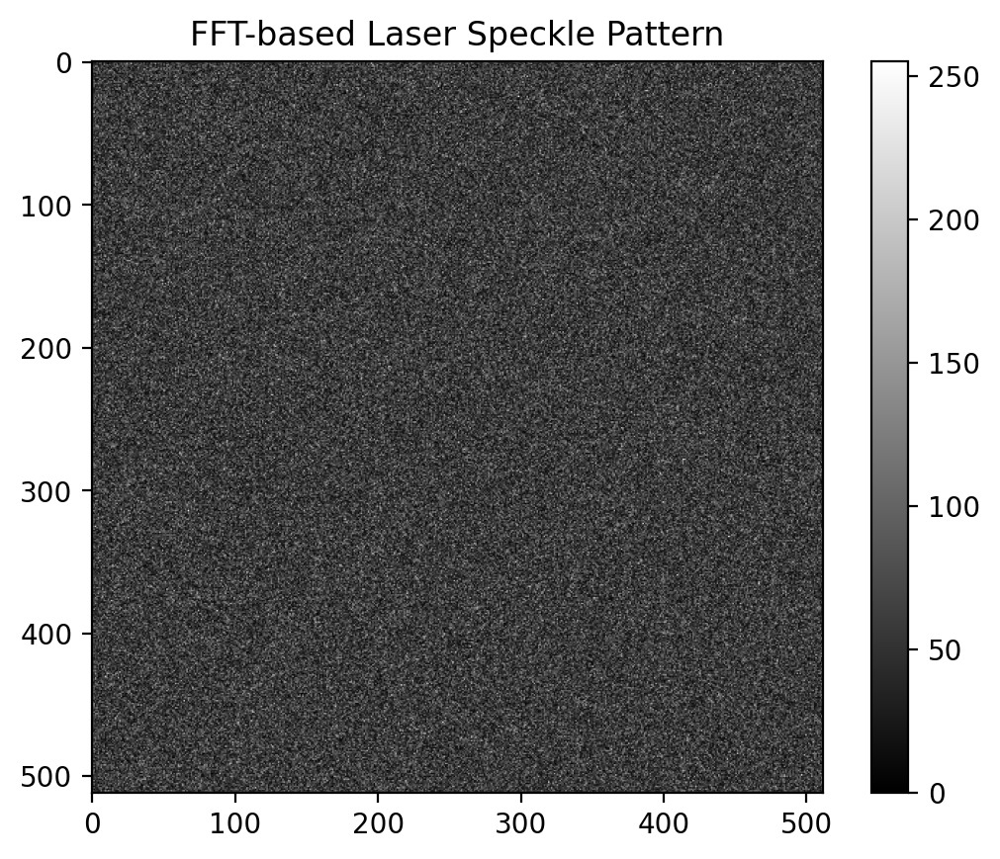

In [20]:
import numpy as np
from numpy.fft import fft2, fftshift, ifft2
from matplotlib import pyplot as plt

def generate_laser_speckle_fft(image_size, frequency_cutoff):
    """
    Generate a laser speckle pattern using FFT.

    Parameters:
    - image_size: Tuple of the form (height, width) for the output image size.
    - frequency_cutoff: Controls the frequency content of the speckle pattern,
                        affecting the speckle size. Lower values result in larger speckles.

    Returns:
    - speckle_pattern: Generated laser speckle pattern as a numpy array.
    """

    # Generate a random phase pattern in Fourier domain
    random_phase = np.exp(2j * np.pi * np.random.rand(image_size[0], image_size[1]))

    # Apply a low-pass filter to control the speckle size
    Y, X = np.ogrid[:image_size[0], :image_size[1]]
    center = (image_size[0] // 2, image_size[1] // 2)
    distance = np.sqrt((X - center[1])**2 + (Y - center[0])**2)
    low_pass_filter = distance <= frequency_cutoff

    filtered_phase = random_phase * low_pass_filter

    # Perform an Inverse FFT to get the speckle pattern in spatial domain
    speckle_field = ifft2(filtered_phase)
    speckle_pattern = np.abs(speckle_field)

    # Normalize the speckle pattern for visualization
    speckle_pattern = (speckle_pattern - speckle_pattern.min()) / (speckle_pattern.max() - speckle_pattern.min()) * 255

    return speckle_pattern

# Example usage
image_size = (512, 512)  # Image size as (height, width)
frequency_cutoff = 1000  # Frequency cutoff for low-pass filter

speckle_pattern = generate_laser_speckle_fft(image_size, frequency_cutoff)

# Display the generated speckle pattern
plt.imshow(speckle_pattern, cmap='gray')
plt.title('FFT-based Laser Speckle Pattern')
plt.colorbar()
plt.show()

In [21]:
speckle_pattern = speckle_pattern/(speckle_pattern.max() - speckle_pattern.min()) - 0.5

In [22]:
#delta_sp = np.max(speckle_pattern) - np.min(speckle_pattern)

In [24]:
#delta_sp

In [25]:
#speckle_pattern = speckle_pattern/delta_sp

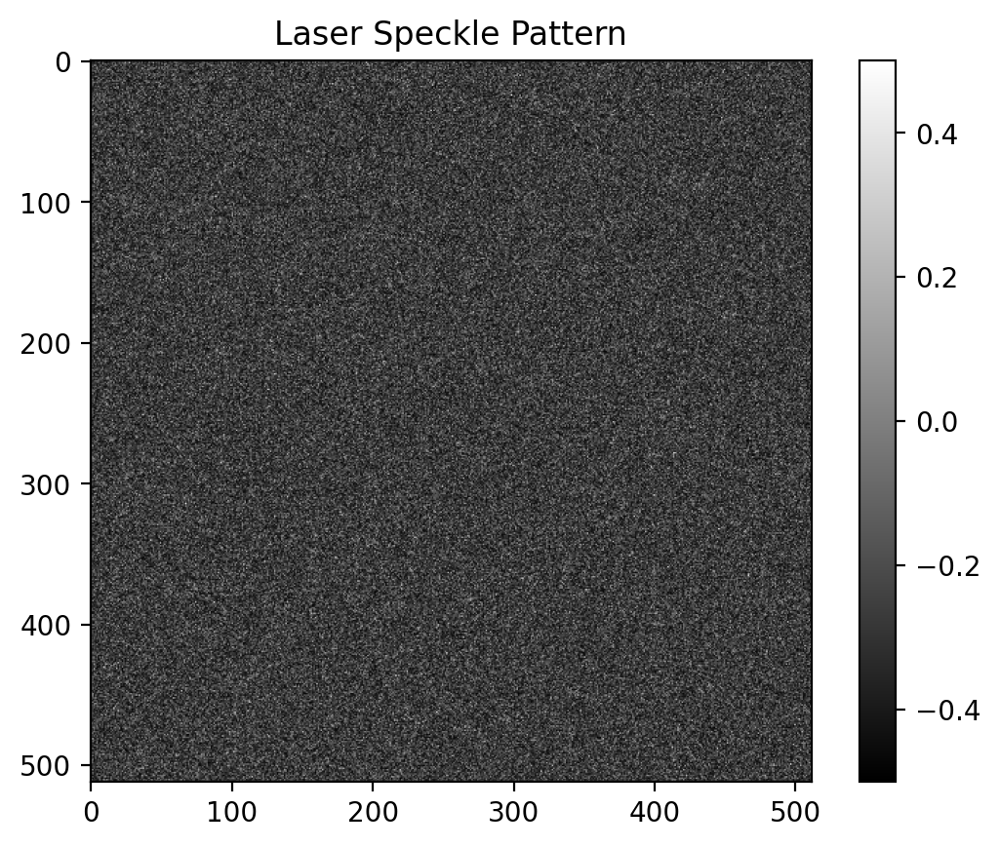

In [26]:
# Display the generated speckle pattern
plt.imshow(speckle_pattern, cmap='gray')
plt.title('Laser Speckle Pattern')
plt.colorbar()
plt.show()

In [27]:
from distgen.dist import UniformLaserSpeckle

In [75]:
params = {'min_x': '-1 mm', 'max_x': '+1 mm', 'min_y': '-2 mm', 'max_y': '+2 mm', 'speckle_size': '1 micron'}
          

D = UniformLaserSpeckle(**params)

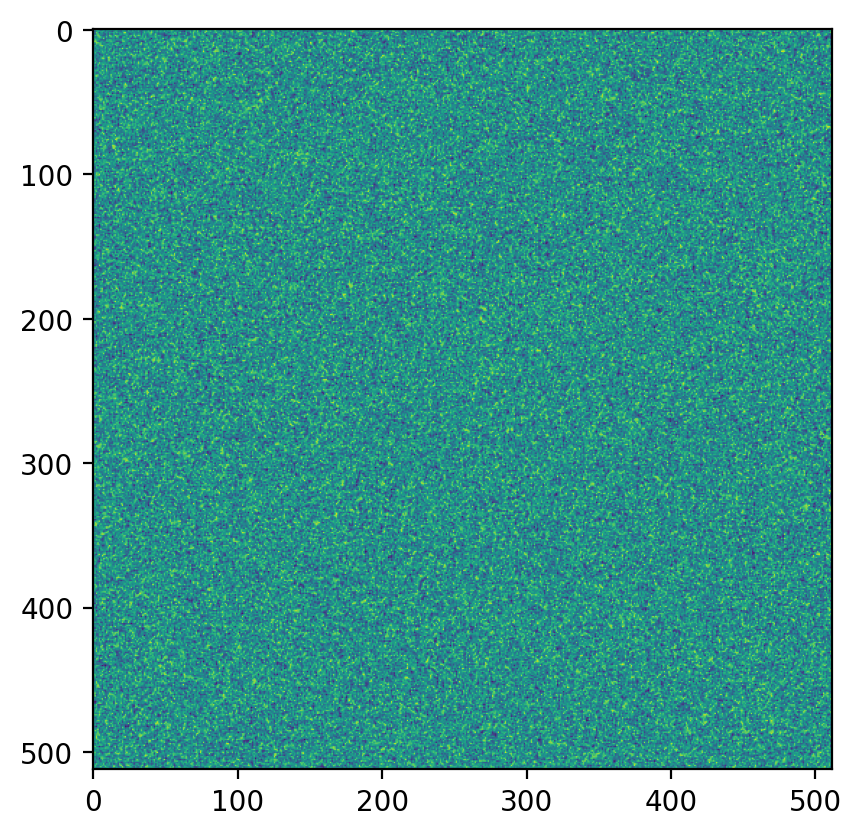

In [76]:
plt.imshow(D.Pxy);

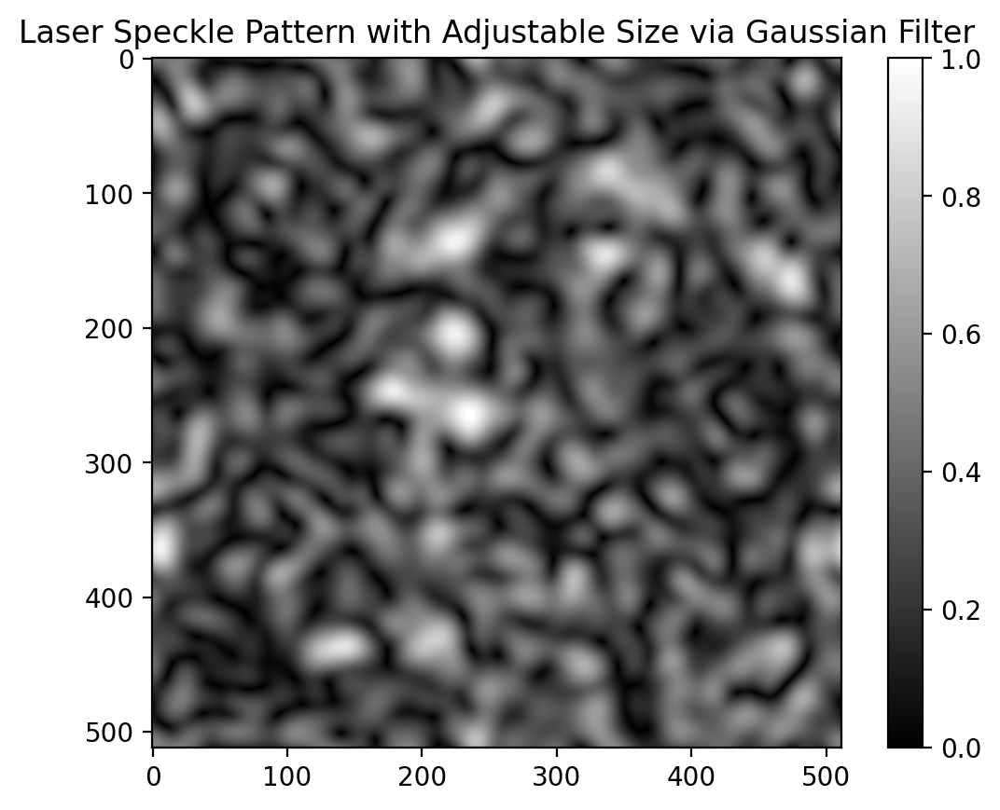

In [74]:
import numpy as np
from numpy.fft import fft2, ifft2, fftshift
import matplotlib.pyplot as plt

def generate_speckle_pattern_with_filter(image_size, sigma):
    """
    Generate a laser speckle pattern using FFT with a Gaussian filter to control speckle size.

    Parameters:
    - image_size: Tuple indicating the size of the output image (height, width).
    - sigma: Standard deviation of the Gaussian filter, controlling the speckle size.
             Smaller sigma leads to larger speckles.

    Returns:
    - speckle_pattern: The generated speckle pattern as a 2D numpy array.
    """
    # Generate a random phase distribution
    random_phase = np.exp(2j * np.pi * np.random.rand(image_size[0], image_size[1]))
    
    # Perform FFT of the random phase distribution
    fft_image = fft2(random_phase)
    
    # Generate a Gaussian filter
    x = np.linspace(-image_size[1]//2, image_size[1]//2, image_size[1])
    y = np.linspace(-image_size[0]//2, image_size[0]//2, image_size[0])
    X, Y = np.meshgrid(x, y)
    gaussian_filter = np.exp(-(X**2 + Y**2) / (2 * sigma**2))
    
    # Apply the Gaussian filter in the Fourier domain
    fft_image_filtered = fftshift(fft_image) * gaussian_filter
    
    # Inverse FFT to get the speckle pattern
    speckle_field = ifft2(fft_image_filtered)
    speckle_pattern = np.abs(speckle_field)
    
    # Normalize the pattern for visualization
    speckle_pattern_normalized = (speckle_pattern - np.min(speckle_pattern)) / (np.max(speckle_pattern) - np.min(speckle_pattern))
    
    return speckle_pattern_normalized

# Example usage
image_size = (512, 512)
sigma = 7 # Adjust this value to control the speckle size

speckle_pattern = generate_speckle_pattern_with_filter(image_size, sigma)

# Display the generated speckle pattern
plt.imshow(speckle_pattern, cmap='gray')
plt.title('Laser Speckle Pattern with Adjustable Size via Gaussian Filter')
plt.colorbar()
plt.show()

In [ ]:
from scipy.ndimage import gaussian_filter
import numpy as np

def estimate_speckle_size(autocorr):
    """
    Estimate the average speckle size from the autocorrelation function.

    Parameters:
    - autocorr: Autocorrelation function of the speckle pattern.

    Returns:
    - average_speckle_size: Estimated average speckle size in pixels.
    """
    # Find the central peak in the autocorrelation function
    central_peak = autocorr[autocorr.shape[0] // 2, :]
    
    # Normalize and find the half maximum
    central_peak_normalized = central_peak / np.max(central_peak)
    half_max = np.max(central_peak_normalized) / 2
    
    # Find the first and last points where the central peak crosses the half maximum
    crossings = np.where(np.diff(central_peak_normalized > half_max))[0]
    if len(crossings) < 2:  # Check if the peak width can be determined
        print('bunk')
        return None  # Or handle this case appropriately
    
    # Estimate the FWHM
    fwhm = crossings[-1] - crossings[0]
    
    # Convert FWHM to average speckle size (assuming 1D speckle size for simplicity)
    average_speckle_size = fwhm
    
    return average_speckle_size

# Assuming 'speckle_pattern' is your generated speckle pattern
# Compute the autocorrelation function of the speckle pattern
autocorr = np.abs(np.fft.ifft2(np.fft.fft2(speckle_pattern) * np.conj(np.fft.fft2(speckle_pattern))))

autocorr
# Estimate the average speckle size
average_speckle_size = estimate_speckle_size(autocorr)
#print("Estimated average speckle size:", average_speckle_size)

In [ ]:
average_speckle_size

In [ ]:
plt.imshow(autocorr)